# Figure 4: MOSTA

Draw the mouse-embryo populations, interaction maps, cartilage-lineage
transitions and velocity fields shown in Figure 4.

Run this notebook from the [CytoBridge code folder](../../installation.md).
The first cell downloads the cell-state inputs if needed. The smaller lineage,
communication and velocity arrays are included with the code.
Work through the panels in order. Panel b calculates ligand–receptor scores,
panel c counts lineage destinations, and panels d–e evaluate the trained model.
The saved population states keep the cells in a–c identical to those in the
article. The [MOSTA analysis tutorial](../dataset_workflows/mosta.ipynb)
introduces population simulation.

A CUDA GPU is used for the model calculations in d–e below. Panels a–c only
need the numerical figure data. Each plot is generated from cell coordinates,
labels or calculated values. Frames and annotations retain the paper's layout.

In [1]:
import os
from pathlib import Path

import CytoBridge as cb
from IPython.display import Image, display

project = Path(os.environ.get("CYTOBRIDGE_PROJECT_DIR", ".")).resolve()
data = project / "data/mosta/paper"
if not (data / "figure4a/slice_data/time_0.h5ad").is_file():
    cb.datasets.download("mosta", destination=project,
                         kind="mosta_figure_data.zip")
output = project / Path("outputs/mosta_paper")
output.mkdir(parents=True, exist_ok=True)

def show(paths):
    for path in paths:
        if Path(path).suffix == ".png":
            display(Image(filename=str(path), width=850))

In [2]:
import json
import numpy as np
import pandas as pd
from reproduction.mosta.main_figure import (
    PANELS, draw_main_figure, draw_interaction_maps, draw_brain_velocity,
)
from reproduction.mosta.calculations import interaction_scores, map_interaction_scores
from reproduction.mosta.figures import style

style()
palette = json.loads((PANELS / "style_authority/label_to_color.json").read_text())

## a. Spatial populations

Plot the observed E12.5, E13.5, E14.5 and E15.5 cells and the generated E13, E14 and E15 populations. The generated states come from one trajectory starting at E12.5 with 50,000 particles, time step 0.05, diffusion 0.03 and seeds 42/43. The simulation includes population growth. Coordinates are not warped. The plotted populations contain 51,365, 63,533, 77,369, 86,610, 102,519, 100,871 and 113,350 cells in time order.

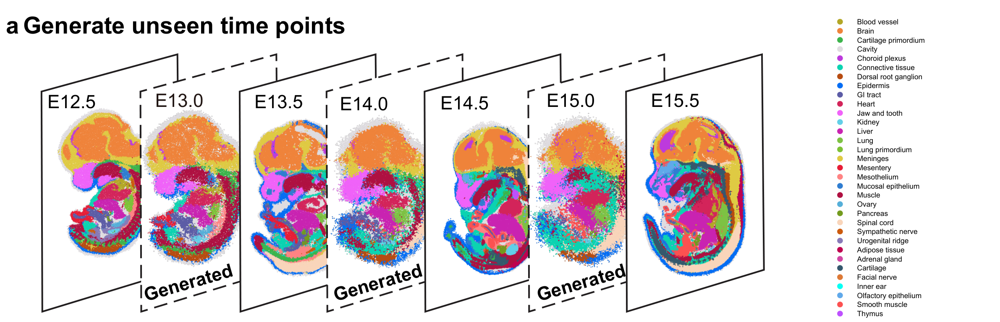

In [3]:
figures = draw_main_figure(data, output, panels="a")
show(figures["a"])

## b. Wnt3a–Fzd7/Lrp6 interaction maps

For each directed cell-type pair, multiply mean ligand expression, mean receptor-complex expression and its communication weight:

`LR score = ligand_mean * receptor_mean * communication_weight`

The receptor complex uses the minimum expression of Fzd7 and Lrp6. The communication weight is `M_per_source`, calculated from the model's attention. Sum incoming and outgoing pair scores for each cell type, then map that value to its cells. These are cell-type scores, not separate LR measurements for each cell.

E13 uses 15,144 generated cells for the calculation and 63,533 cells for the spatial display. The table preserves that distinction. Cells without a corresponding score stay grey. The final plot scales colours to the 1st–99th percentiles separately at each time.

,time,cell_type,incoming,outgoing,total
0,0.0,Blood vessel,0.004873,0.000000,0.004873
1,0.0,Brain,0.031119,0.002092,0.033211
2,0.0,Cartilage primordium,0.039643,0.028917,0.068560
3,0.0,Cavity,0.036982,0.022320,0.059301
4,0.0,Choroid plexus,0.224738,0.357640,0.582378


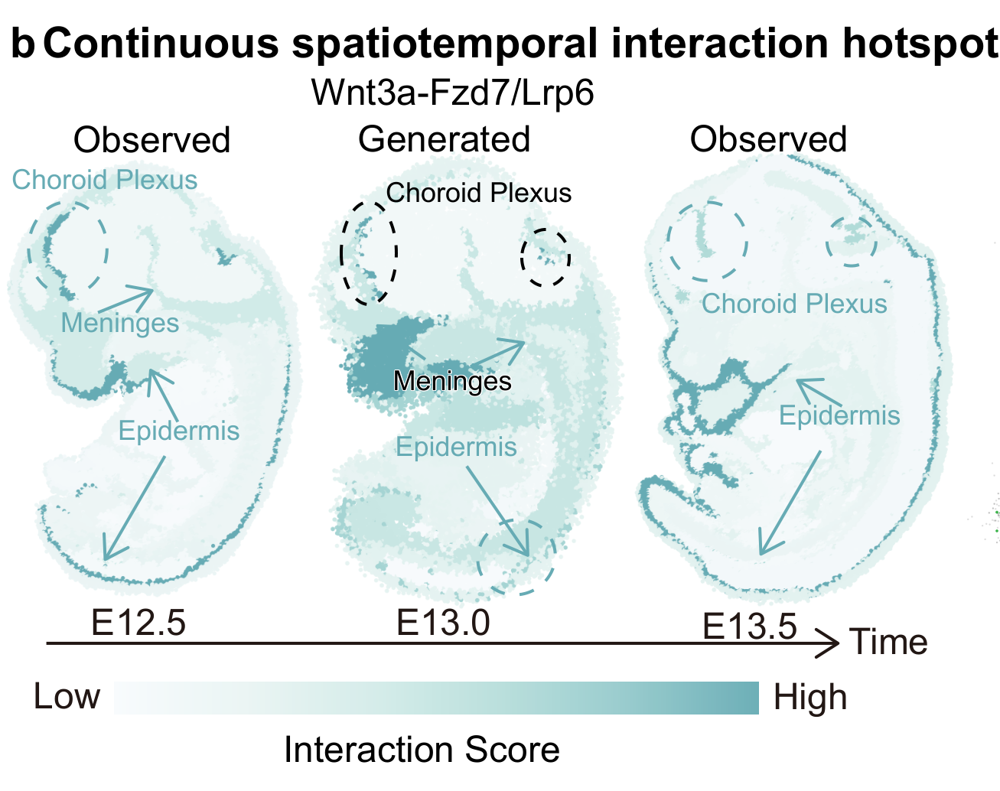

In [4]:
edges = pd.read_csv(PANELS / "fig4b/evidence/type_matrix.csv")
scores = interaction_scores(edges)
display(scores[["time", "cell_type", "incoming", "outgoing", "total"]].head())

cells_to_plot = pd.read_csv(data / "figure4b/cell_mapping.csv.gz", low_memory=False)
mapping = map_interaction_scores(cells_to_plot, scores)
show(draw_interaction_maps(data, output, mapping=mapping))

## c. Cartilage lineage

Follow the same simulated particles from E15 to E15.5 (model times 2.5 to 3). Select the 1,282 particles labelled cartilage primordium at E15 and count their destination labels. Divide by 1,282 to obtain transition fractions. This analysis uses a fixed-particle trajectory, so particle identities remain available across time.

The three largest destinations are cartilage, cartilage primordium and connective tissue. The plot shows their simulated destinations over the observed E15.5 background.

,cells,fraction
Cartilage,348,0.271451
Cartilage primordium,253,0.197348
Connective tissue,243,0.189548


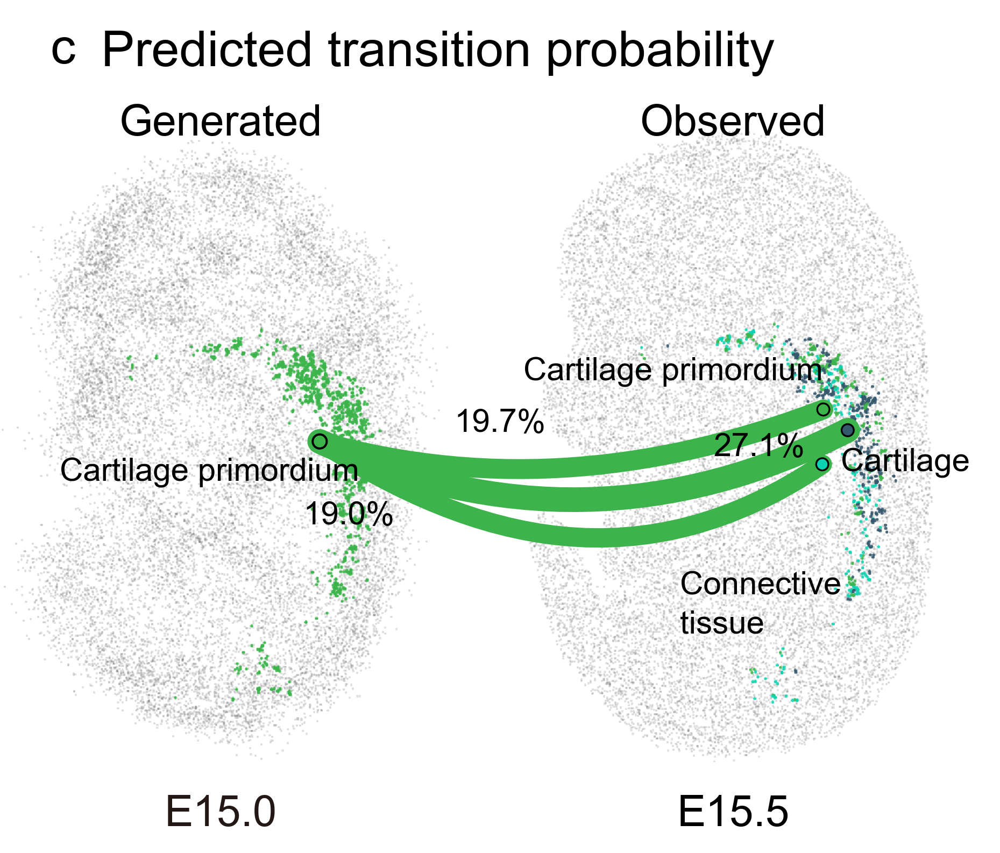

In [5]:
with np.load(PANELS / "fig4c/evidence/numeric_render_state.npz", allow_pickle=False) as state:
    destination = pd.Series(state["target_labels"].astype(str))
counts = destination.value_counts()
fractions = counts / len(destination)
display(pd.DataFrame({"cells": counts, "fraction": fractions}).head(3))
figures = draw_main_figure(data, output, panels="c")
show(figures["c"])

## d. Interaction-induced gene velocity

Evaluate the downloaded model on the same 8,000 observed E15.5 cells used in the paper. `compute_velocity_components` returns intrinsic drift, interaction and score terms. Full velocity is their sum.

Take the last 50 dimensions of the interaction term and project this gene-state derivative onto spatial coordinates using a 30-neighbour graph. Calculate attention and cell-type communication on the same 8,000 cells. The displayed arrows connect Choroid plexus, Meninges and Brain. The Brain→Brain loop aggregates communication between brain cells.

`calculate_velocity_panel` runs these public APIs and writes the numerical fields and communication table. The next cell passes those newly calculated files to the paper's plotting function.

computing velocity graph (using 1/160 cores)


  0%|          | 0/8000 [00:00<?, ?cells/s]

    finished (0:00:03) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding


    finished (0:00:00) --> added
    'velocity_spatial', embedded velocity vectors (adata.obsm)


computing velocity graph (using 1/160 cores)


  0%|          | 0/8000 [00:00<?, ?cells/s]

    finished (0:00:03) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding


    finished (0:00:00) --> added
    'velocity_spatial', embedded velocity vectors (adata.obsm)


Time 3.0 cells 8000 of 8000


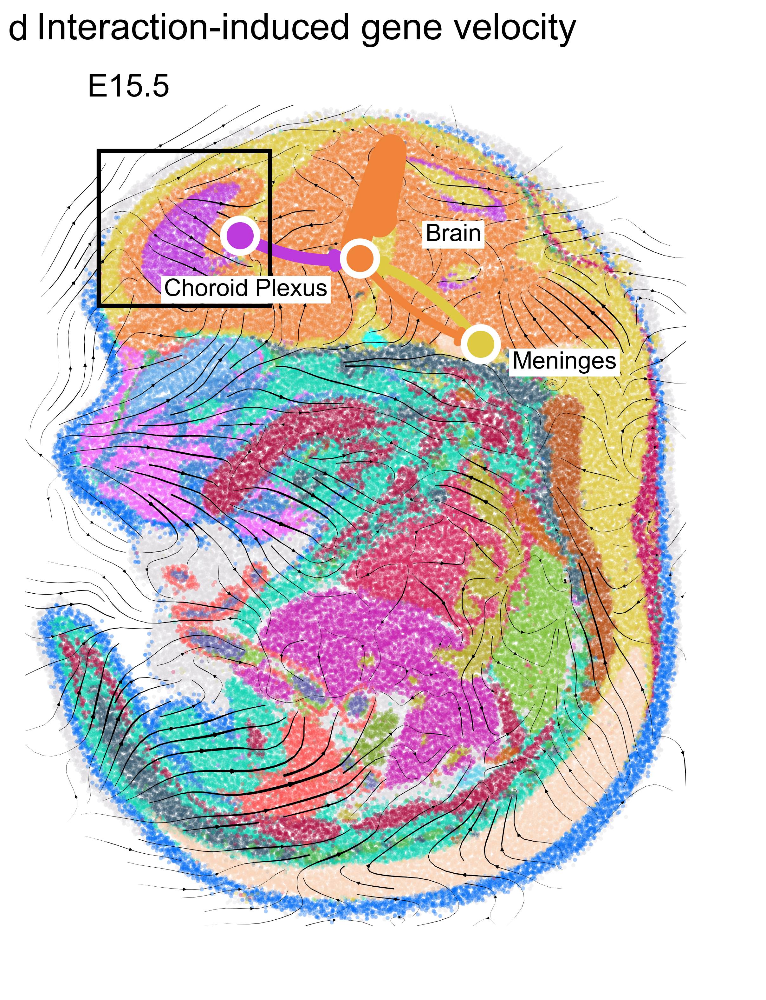

In [6]:
from reproduction.mosta.calculations import calculate_velocity_panel
from reproduction.mosta.interaction_velocity import draw_interaction_velocity

model_dir = project / "data/mosta/model"
if not (model_dir / "config.yaml").is_file():
    cb.datasets.download("mosta", destination=project, kind="mosta_model.zip")

numeric_d = calculate_velocity_panel(model_dir, output / "calculated_d", "d", device="cuda", overwrite=True)
show(draw_interaction_velocity(
    numeric_d, numeric_d.parent / "communication_all_type_edges.csv.gz", palette, output,
))

## e. Brain velocity fields

Evaluate all 17,071 observed E15.5 Brain cells with interaction group size 1,024. Project the gene derivatives before selecting the displayed brain region. All four plots use spatial coordinates: two show projected gene derivatives and two show the first two (spatial) model dimensions.

The comparison is full velocity (`drift + interaction + score`) versus interaction velocity. The displayed region is −1.3 < x < −0.5 and 3.3 < y < 4.2.

computing velocity graph (using 1/160 cores)


  0%|          | 0/17071 [00:00<?, ?cells/s]

    finished (0:00:08) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding


    finished (0:00:02) --> added
    'velocity_spatial', embedded velocity vectors (adata.obsm)


computing velocity graph (using 1/160 cores)


  0%|          | 0/17071 [00:00<?, ?cells/s]

    finished (0:00:08) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding


    finished (0:00:02) --> added
    'velocity_spatial', embedded velocity vectors (adata.obsm)


  Zoom-in subset: 2844 cells remaining.


  Zoom-in subset: 2844 cells remaining.


  Zoom-in subset: 2844 cells remaining.


  Zoom-in subset: 2844 cells remaining.


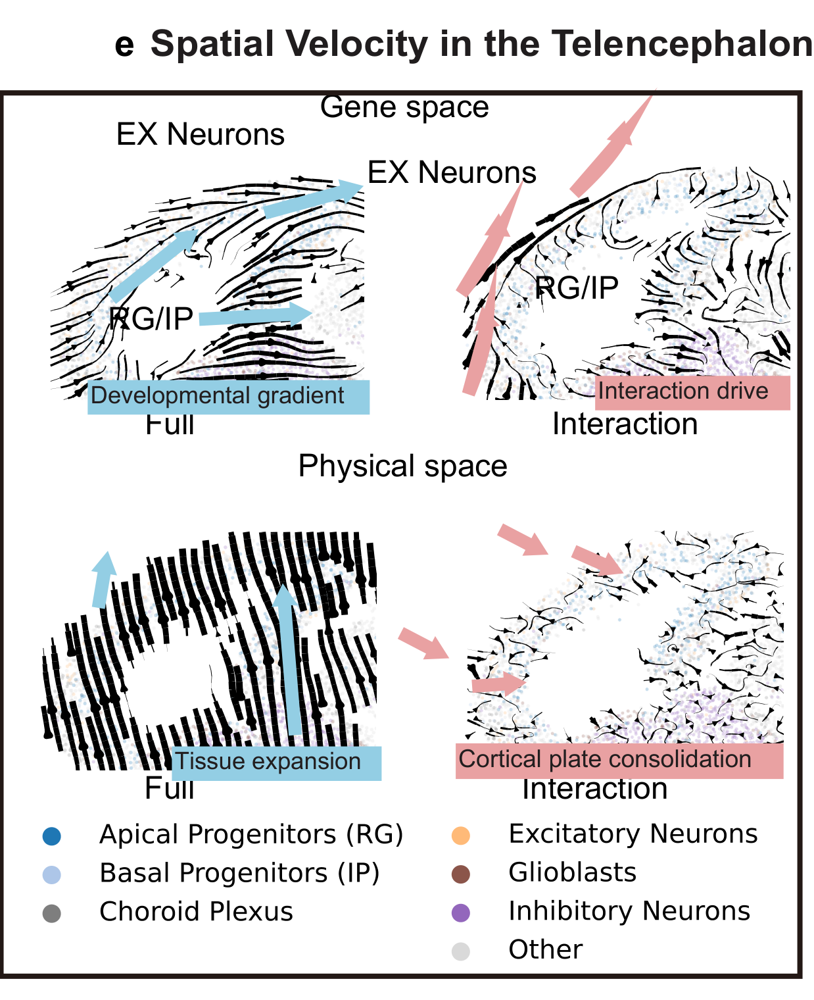

In [7]:
numeric_e = calculate_velocity_panel(model_dir, output / "calculated_e", "e", device="cuda", overwrite=True)
show(draw_brain_velocity(output, numeric_path=numeric_e))